In [1]:
import matplotlib.pyplot as plt
import rasterio
import rioxarray
from lib import geoscraping as geo
import json
from rasterio.plot import show

In [1]:
my_str = "everyplaceigo.tif"
print(my_str[-3:])
str_a = my_str[:-4]
print(str_a)

tif


In [2]:
# Simple query - gets all "major" roads within a custom bounding box of Tuscaloosa
raster_fp = "./data/tuscaloosa.tif" #"../tuscaloosa1m.tif"
image = rasterio.open(raster_fp)
q = geo.roadquery([33.16558, -87.57477, 33.23129, -87.48422], "highway", "")

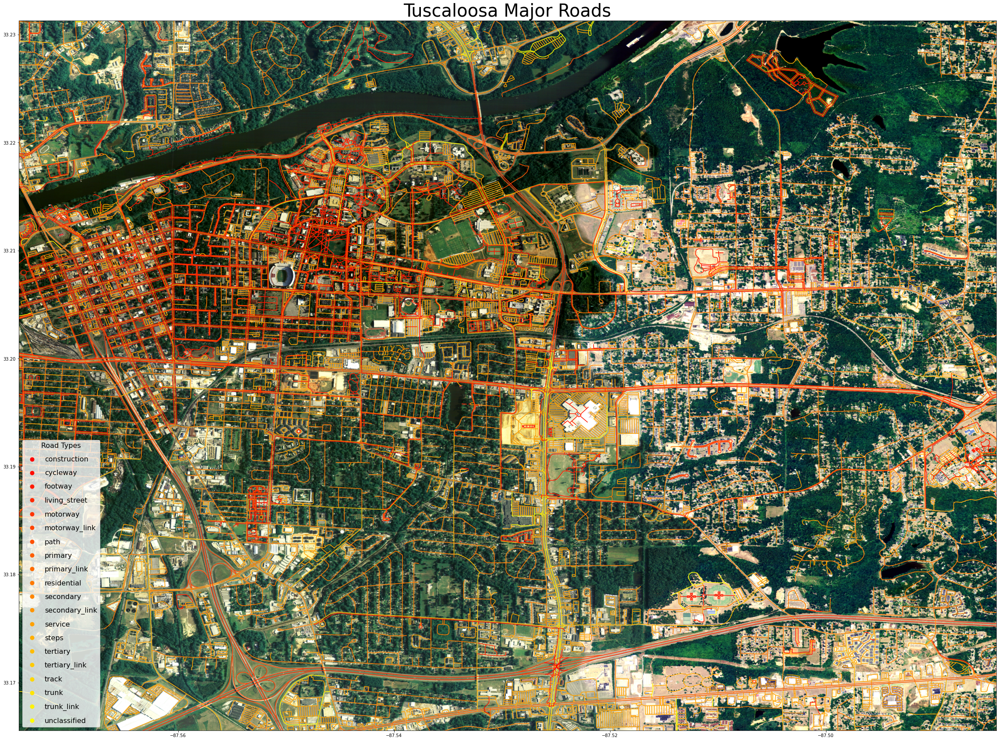

<Figure size 432x288 with 0 Axes>

In [3]:
# plot the results to visualize the polylines
fig, ax = plt.subplots(figsize=(40, 40))
legend_kwds = {
    "loc": "lower left",
    "fontsize": "16",
    "title": "Road Types",
    "title_fontsize": "16",
    "labelspacing": 1,
}
ax.set_title("Tuscaloosa Major Roads", fontsize=40)
q.plot(column="highway", ax=ax, cmap="autumn", legend=True, legend_kwds=legend_kwds)
show(image, ax=ax)
plt.show()

In [5]:
import os
import geopandas as gpd

thin_gdf = gpd.GeoDataFrame(geometry=q.geometry, crs="EPSG:4326")

out_folder = './data/tests/jacob_osm'
if not os.path.exists(out_folder): os.mkdir(out_folder)
thin_gdf.to_file(os.path.join(out_folder, 'roads.shp'))


In [5]:
# Simple query of libraries in a bounding box within Tuscaloosa
bounds = [33.16558, -87.57477, 33.23129, -87.48422]
result = geo.buildingquery(bounds, "building", "")

# convert to Polygons and plot
frame = geo.querytoframe(result)

print(frame)

                                                geometry    building amenity  \
0      POLYGON ((-87.56737 33.20948, -87.56727 33.209...         yes     NaN   
1      POLYGON ((-87.56715 33.20921, -87.56727 33.209...         yes     NaN   
2      POLYGON ((-87.56737 33.20948, -87.56725 33.209...  commercial    bank   
3      POLYGON ((-87.56556 33.20411, -87.56550 33.203...         yes    bank   
4      POLYGON ((-87.56550 33.20394, -87.56556 33.204...         yes     pub   
...                                                  ...         ...     ...   
17214  POLYGON ((-87.48406 33.17018, -87.48409 33.170...         NaN     NaN   
17215  POLYGON ((-87.48404 33.22805, -87.48422 33.228...         NaN     NaN   
17216  POLYGON ((-87.48403 33.20537, -87.48403 33.205...         NaN     NaN   
17217  POLYGON ((-87.48402 33.18020, -87.48405 33.180...         NaN     NaN   
17218  POLYGON ((-87.48394 33.20639, -87.48394 33.206...         NaN     NaN   

                           name addr:ci

<AxesSubplot:title={'center':'Test Building Footprint Query'}>

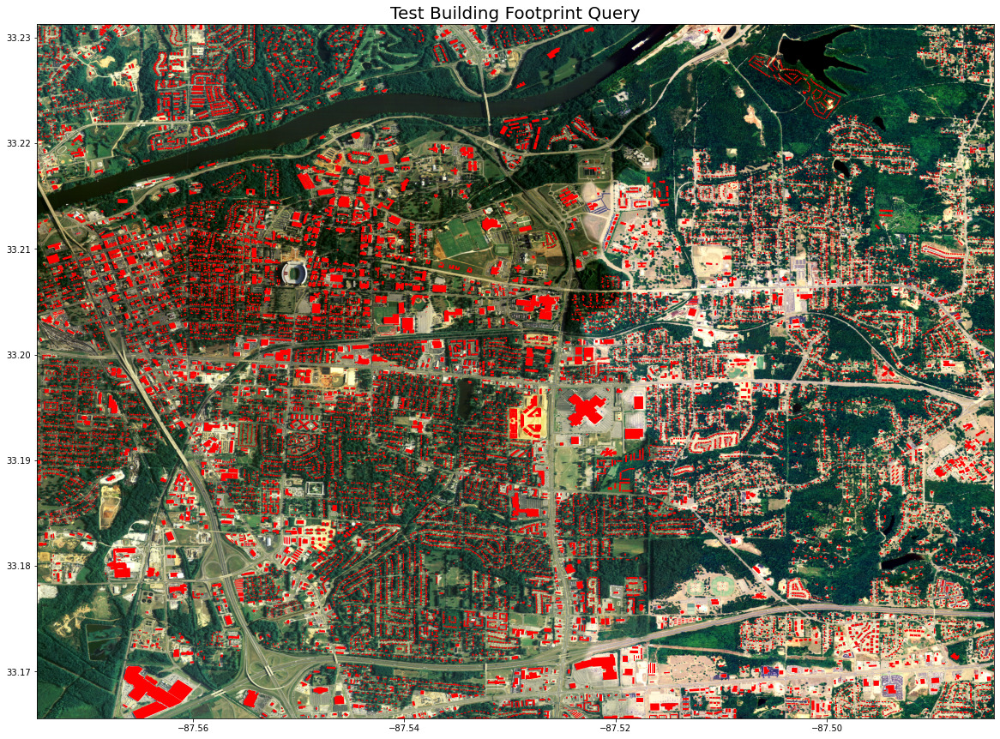

In [6]:
fig, ax = plt.subplots(figsize=(20, 20))
ax.set_title("Test Building Footprint Query", fontsize=20)
frame.plot(ax=ax, color='red')
show(image, ax=ax)